# 4. 잘 만든 Augmentation, 이미지 100장 안 부럽다.

### Data augmentation

./images/mycat.jpg
<PIL.Image.Image image mode=RGB size=500x400 at 0x28EA387C310>


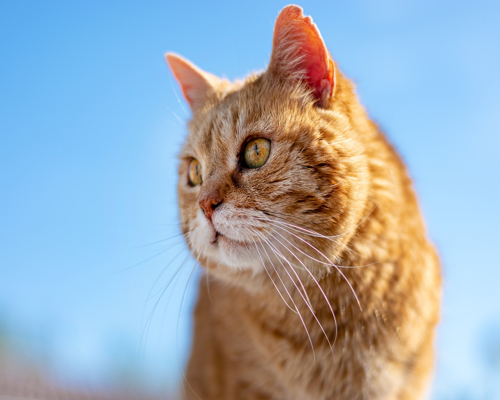

In [15]:
import tensorflow as tf
from PIL import Image
import matplotlib.pyplot as plt
import os

# sample_img_path = os.getenv("HOME") + "/aiffel/data_augmentation/images/mycat.jpg"
sample_img_path = "./images/mycat.jpg"


print(sample_img_path)

image = Image.open(sample_img_path).resize(
    (500, 400)
)  # 이미지에 따라 숫자를 바꾸어 보세요.
image_tensor = tf.keras.preprocessing.image.img_to_array(image)

print(image)
image


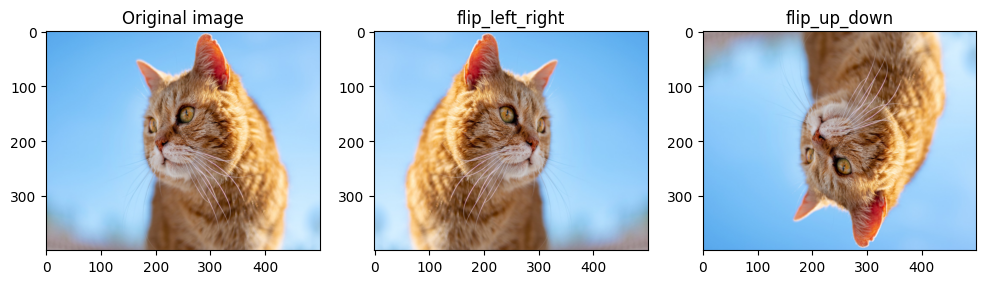

In [16]:
def flip_image(image_tensor):
    flip_lr_tensor = tf.image.flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

    plt.figure(figsize=(12, 12))

    plt.subplot(1, 3, 1)
    plt.title("Original image")
    plt.imshow(image)

    plt.subplot(1, 3, 2)
    plt.title("flip_left_right")
    plt.imshow(flip_lr_image)

    plt.subplot(1, 3, 3)
    plt.title("flip_up_down")
    plt.imshow(flip_ud_image)

    plt.show()


flip_image(image_tensor)


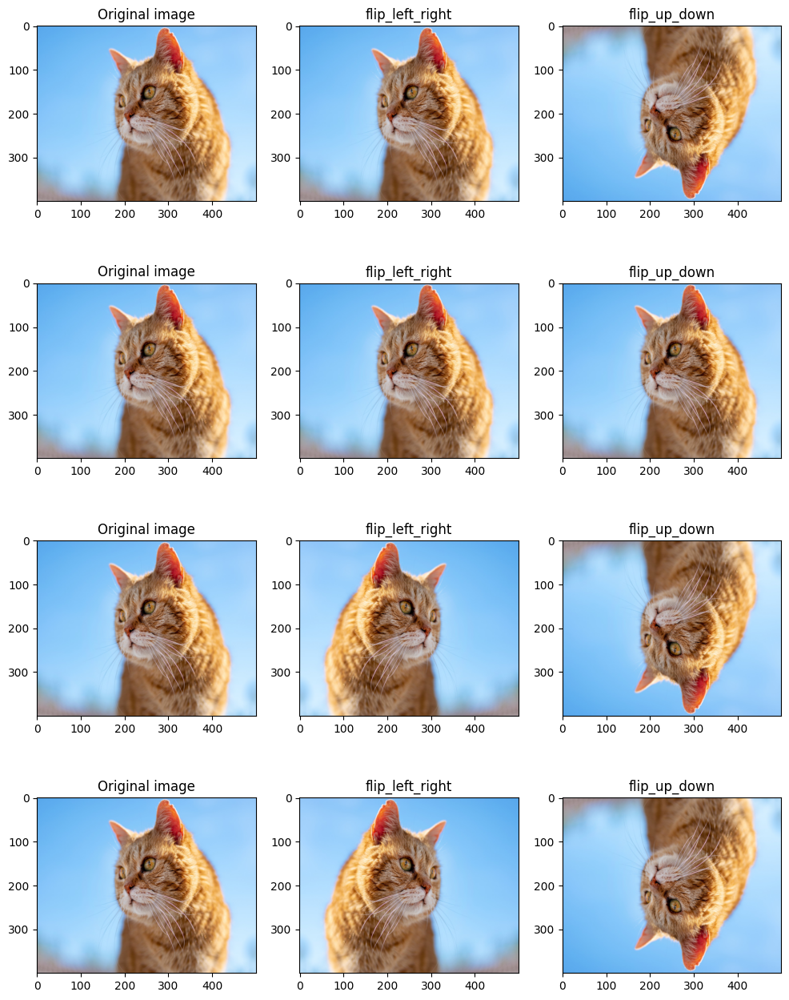

In [17]:
## random
plt.figure(figsize=(12, 16))

row = 4
for i in range(row):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_tensor = tf.image.random_flip_up_down(image_tensor)
    flip_lr_image = tf.keras.preprocessing.image.array_to_img(flip_lr_tensor)
    flip_ud_image = tf.keras.preprocessing.image.array_to_img(flip_ud_tensor)

    plt.subplot(row, 3, i * 3 + 1)
    plt.title("Original image")
    plt.imshow(image)

    plt.subplot(row, 3, i * 3 + 2)
    plt.title("flip_left_right")
    plt.imshow(flip_lr_image)

    plt.subplot(row, 3, i * 3 + 3)
    plt.title("flip_up_down")
    plt.imshow(flip_ud_image)


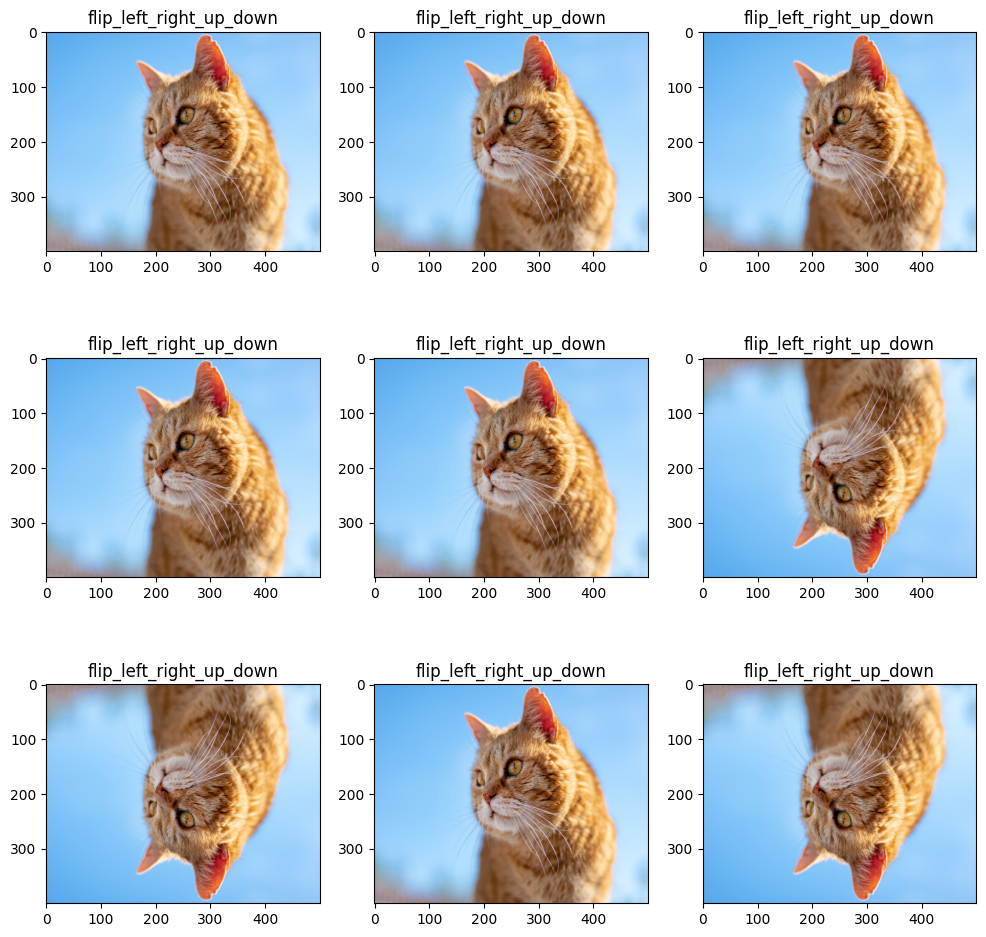

In [18]:
# Q. random_flip 을 구현하세요.


def random_flip(image_tensor):
    flip_lr_tensor = tf.image.random_flip_left_right(image_tensor)
    flip_ud_lr_tensor = tf.image.random_flip_up_down(flip_lr_tensor)
    flipped = tf.keras.preprocessing.image.array_to_img(flip_ud_lr_tensor)
    return flipped


plt.figure(figsize=(12, 12))

num = 9
for i in range(num):
    plt.subplot(3, 3, i + 1)
    plt.title("flip_left_right_up_down")
    flipped = random_flip(image)
    plt.imshow(flipped)


### 4-6. 텐서플로우를 사용한 Image Augmentation (2) Center Crop

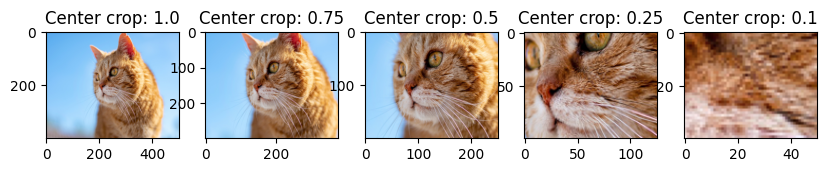

In [19]:
plt.figure(figsize=(12, 15))

central_fractions = [1.0, 0.75, 0.5, 0.25, 0.1]
col = len(central_fractions)
for i, frac in enumerate(central_fractions):
    cropped_tensor = tf.image.central_crop(image_tensor, frac)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

    plt.subplot(1, col + 1, i + 1)
    plt.title(f"Center crop: {frac}")
    plt.imshow(cropped_img)


=3


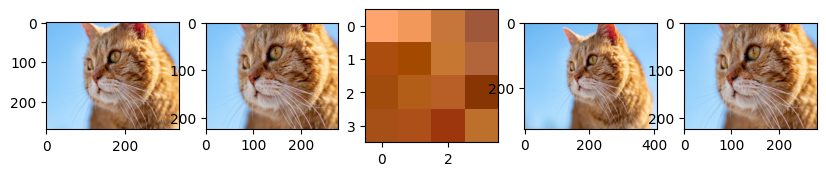

In [20]:
def random_central_crop(image_tensor, range=(0, 1)):
    # range 범위에서 무작위로 잘라낼 비율을 선택합니다
    central_fraction = tf.random.uniform(
        [1], minval=range[0], maxval=range[1], dtype=tf.float32
    )
    cropped_tensor = tf.image.central_crop(image_tensor, central_fraction)
    return cropped_tensor


print("=3")

plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    cropped_tensor = random_central_crop(image_tensor)
    cropped_img = tf.keras.preprocessing.image.array_to_img(cropped_tensor)

    plt.subplot(1, col + 1, i + 1)
    plt.imshow(cropped_img)
    

### 4-7. 텐서플로우를 사용한 Image Augmentation (3) 직접 해보기

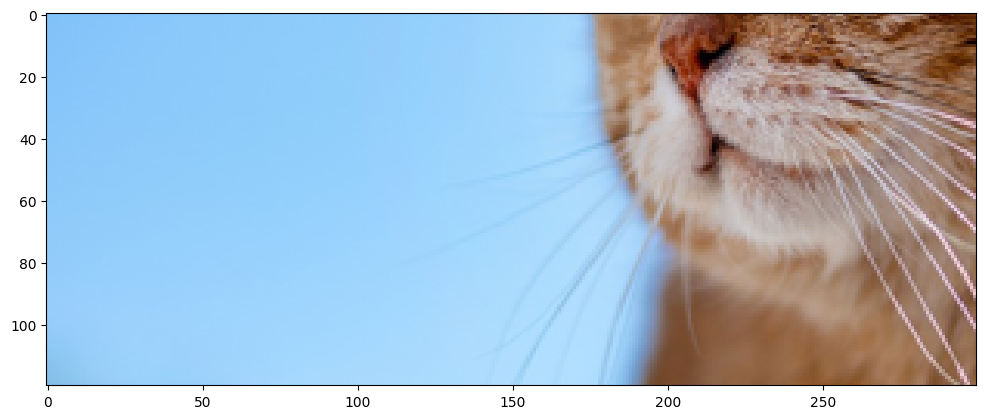

In [21]:
# apply random_crop on cat image
plt.figure(figsize=(12, 15))

random_crop_tensor = tf.image.random_crop(image, size=[120, 300, 3])
random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)

plt.imshow(random_crop_image)
plt.show()


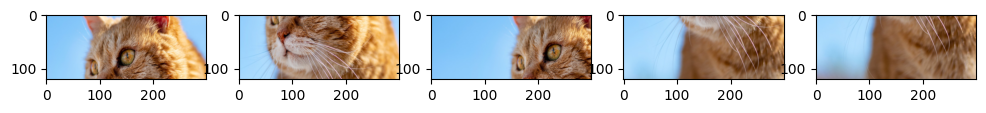

In [22]:
# display 5 random cropped images

plt.figure(figsize=(12, 15))

for i in range(5):
    random_crop_tensor = tf.image.random_crop(image, size=[120, 300, 3])
    random_crop_image = tf.keras.preprocessing.image.array_to_img(random_crop_tensor)
    # 여기에 코드를 입력해 주세요. hint : plt.subplot()
    plt.subplot(1, 5, i + 1)
    plt.imshow(random_crop_image)


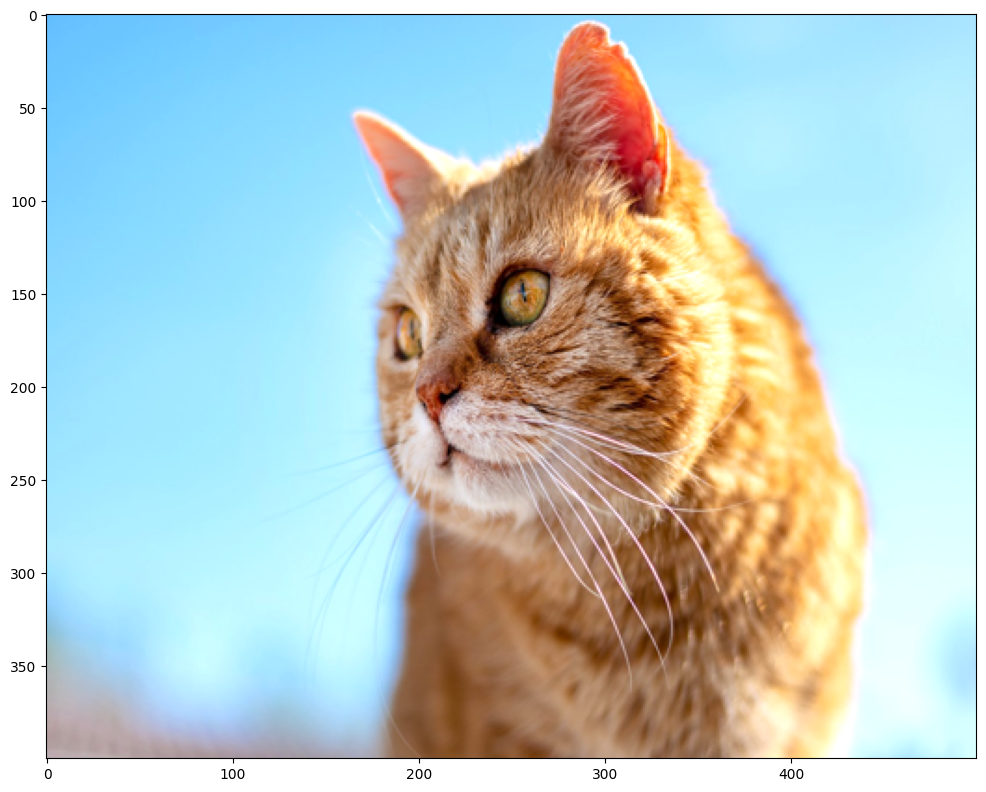

In [23]:
# apply random_brightness on cat image
plt.figure(figsize=(12, 15))

# 여기에 코드를 입력해 주세요. # hint : 밝기 변화가 느껴지지 않나요? delta값을 변경해보세요. 예) max_delta=128
max_delta = 128
random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta)
cliped_random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
# <--여기에 코드를 입력해 주세요. hint :random_brightness()를 통과한 텐서의 값들중 0~255를 벗어나는 값이 있진 않을까요? 나머지 두개 인자를 어떻게 주어야할까요?
random_bright_image = tf.keras.preprocessing.image.array_to_img(
    cliped_random_bright_tensor
)

plt.imshow(random_bright_image)
plt.show()


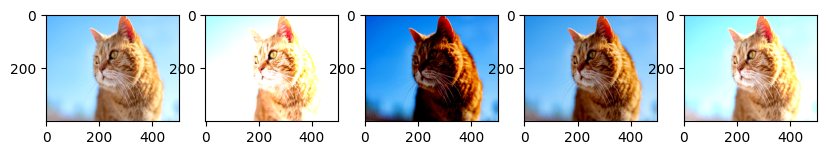

In [24]:
# display 5 random brightness images

plt.figure(figsize=(12, 15))

col = 5
for i in range(col):
    random_bright_tensor = tf.image.random_brightness(image_tensor, max_delta=128)
    cliped_random_bright_tensor = tf.clip_by_value(random_bright_tensor, 0, 255)
    random_bright_image = tf.keras.preprocessing.image.array_to_img(
        cliped_random_bright_tensor
    )

    plt.subplot(1, col + 1, i + 1)
    plt.imshow(random_bright_image)


### 4-8. albumentations 라이브러리


In [25]:
import numpy as np
image = Image.open(sample_img_path).resize((400, 300)) # 이미지에 따라 숫자를 바꾸어 보세요.
image_arr = np.array(image)

print(image_arr.shape)


def visualize(image):
    plt.figure(figsize=(20, 10))
    plt.imshow(image)


(300, 400, 3)


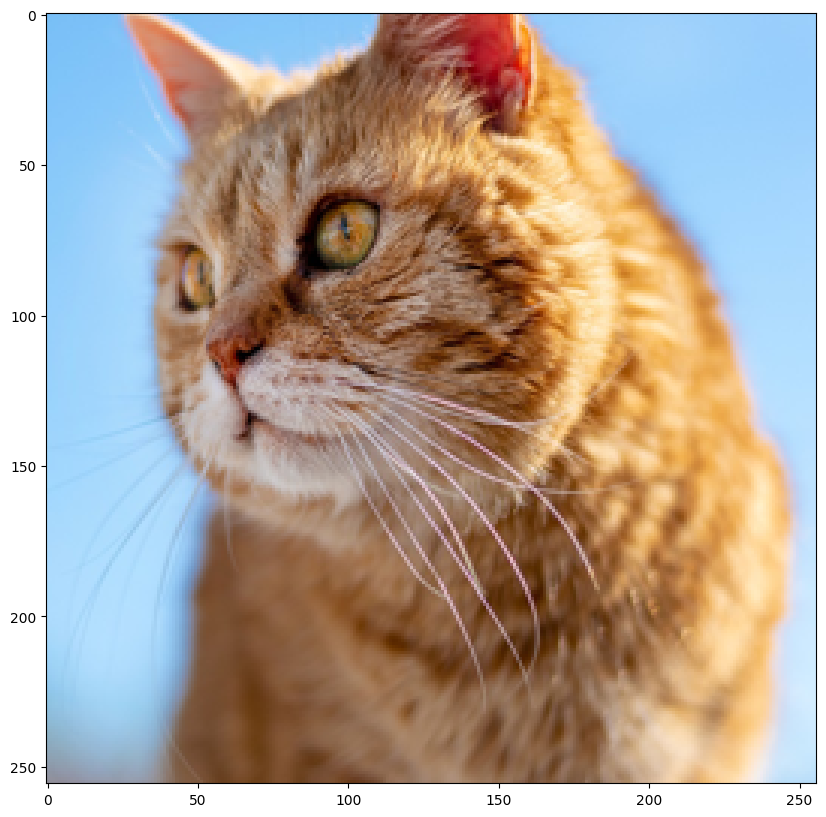

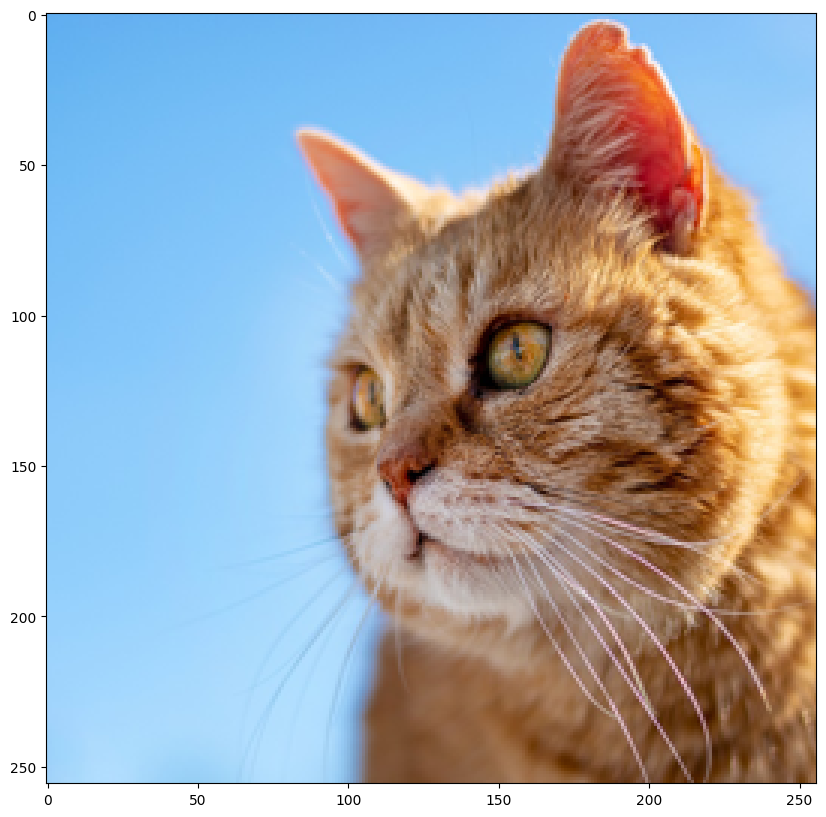

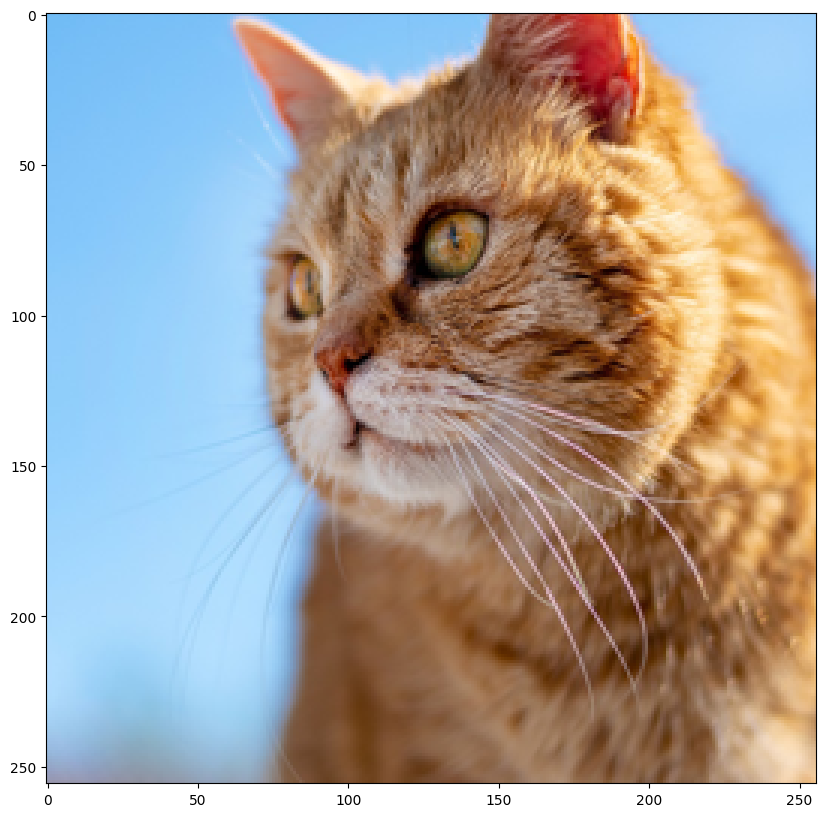

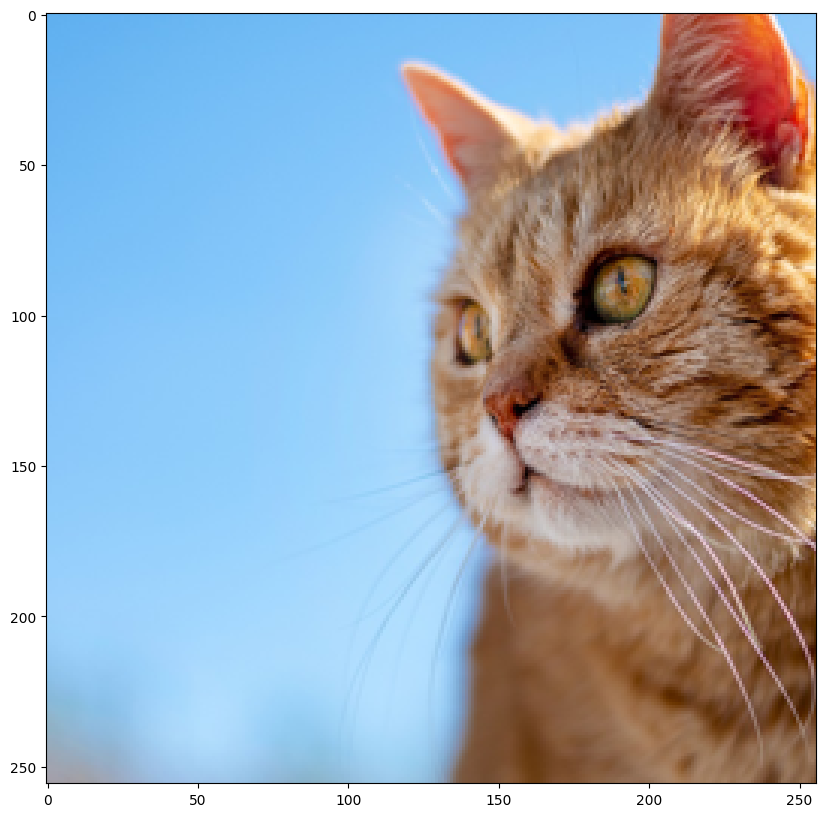

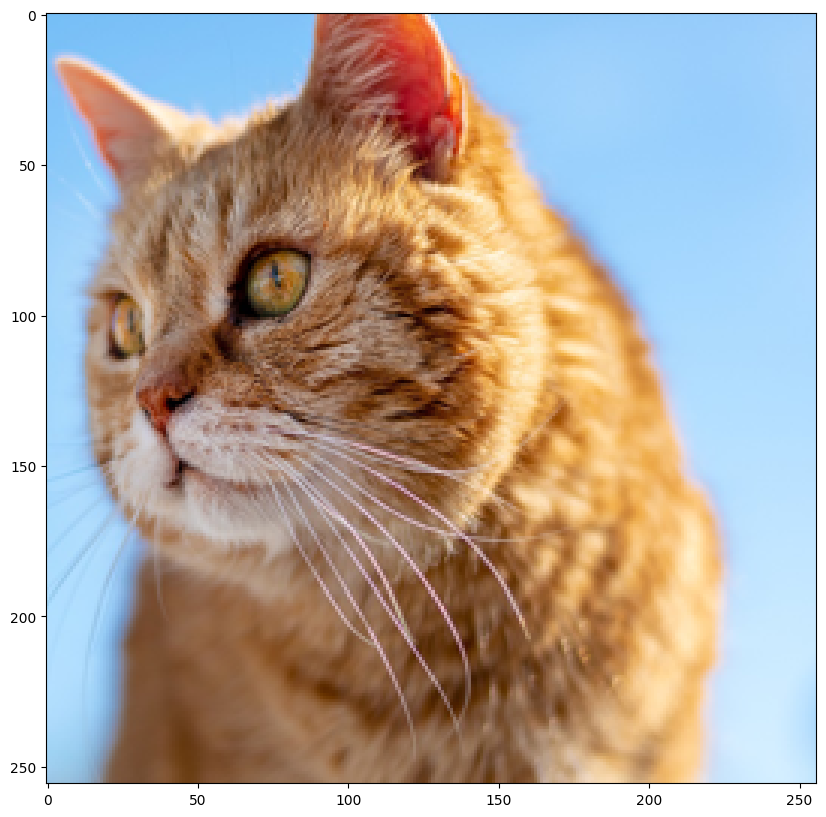

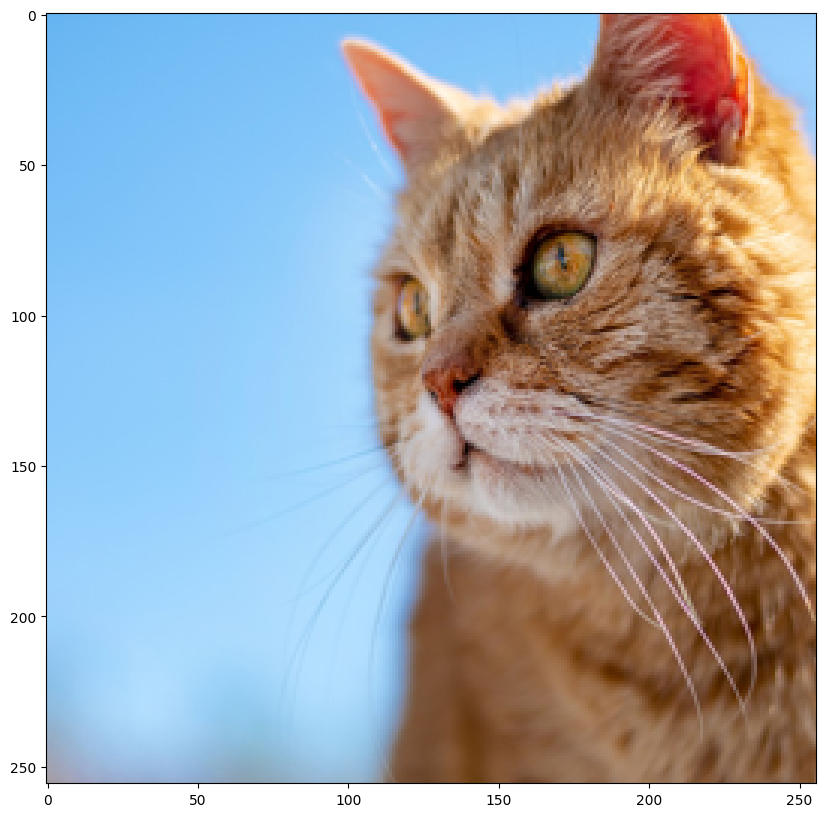

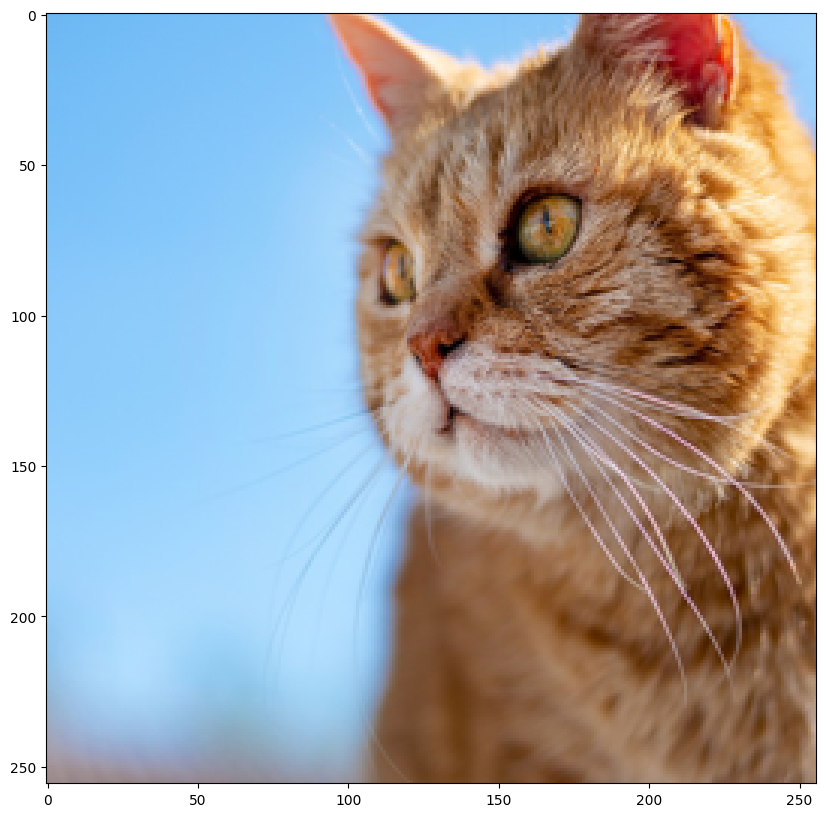

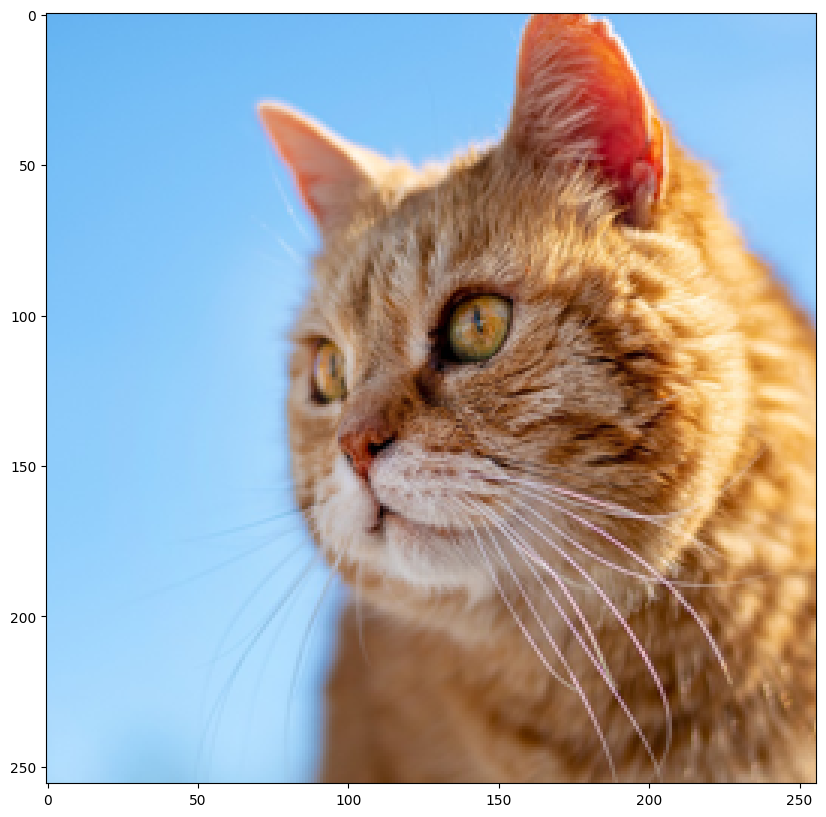

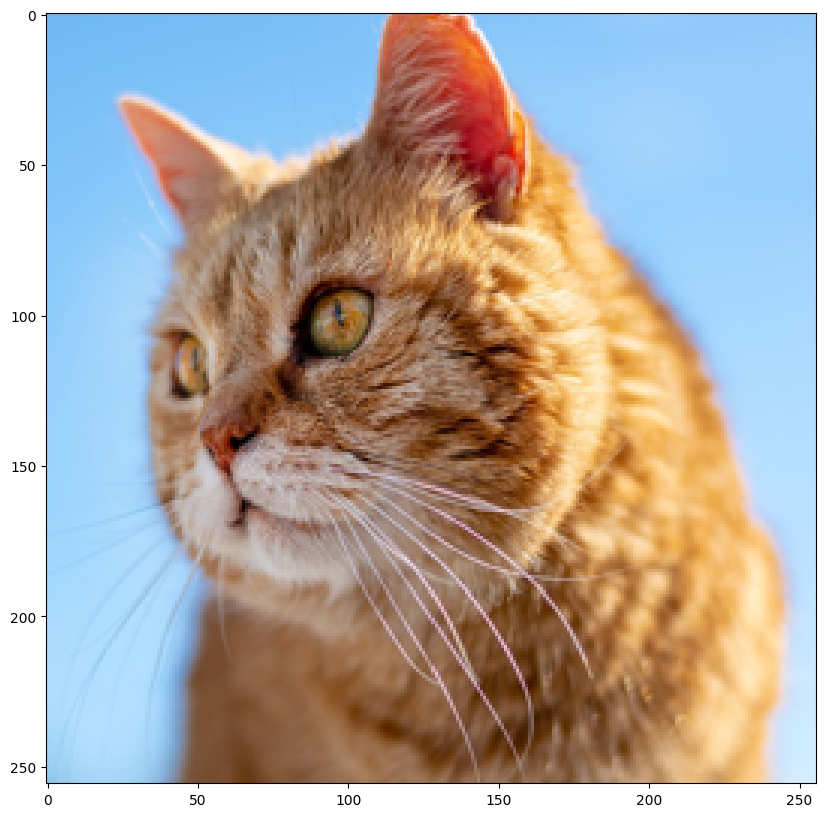

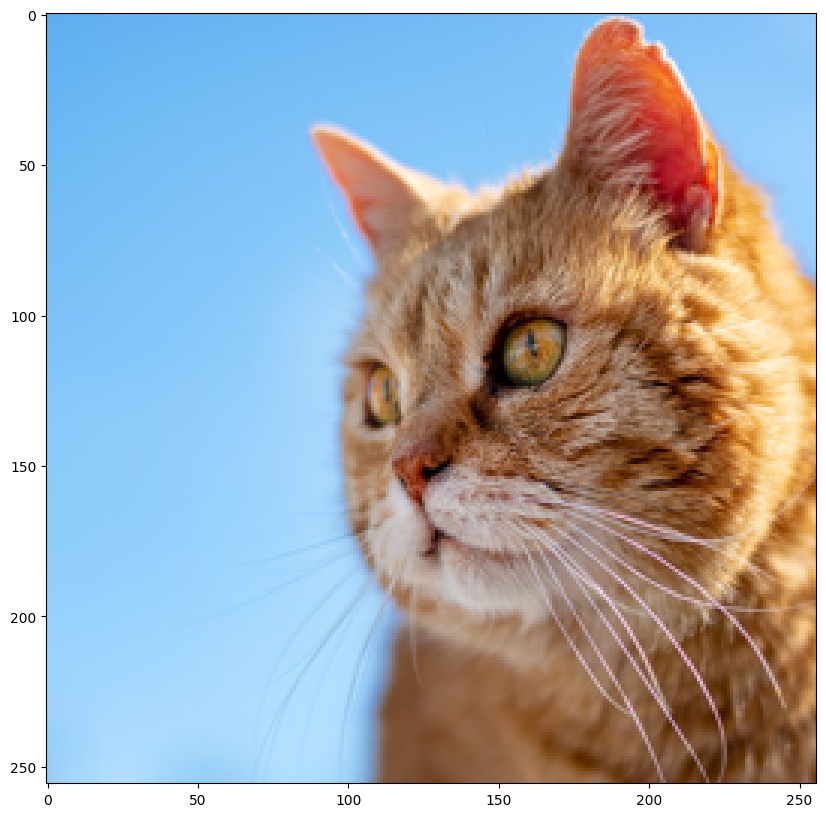

In [27]:
for i in range(10):
    transform = A.Compose([A.RandomCrop(width=256, height=256)])
    transformed = transform(image=image_arr)
    visualize(transformed["image"])


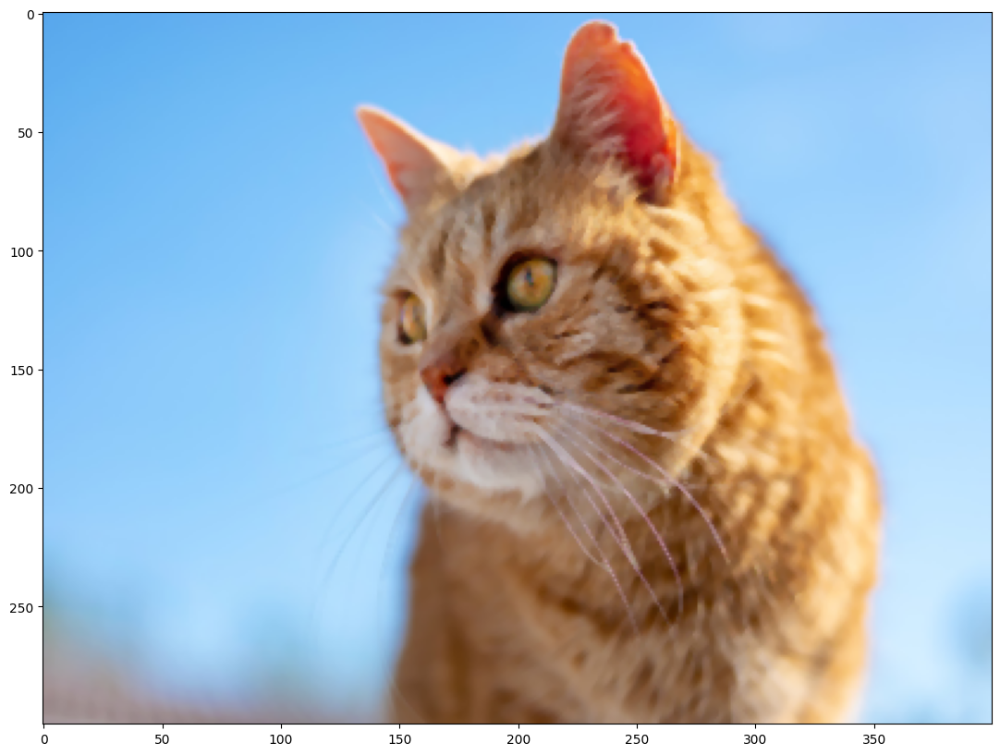

In [28]:
transform = A.Compose([A.MedianBlur(blur_limit=7, always_apply=False, p=0.5)])
transformed = transform(image=image_arr)
visualize(transformed["image"])


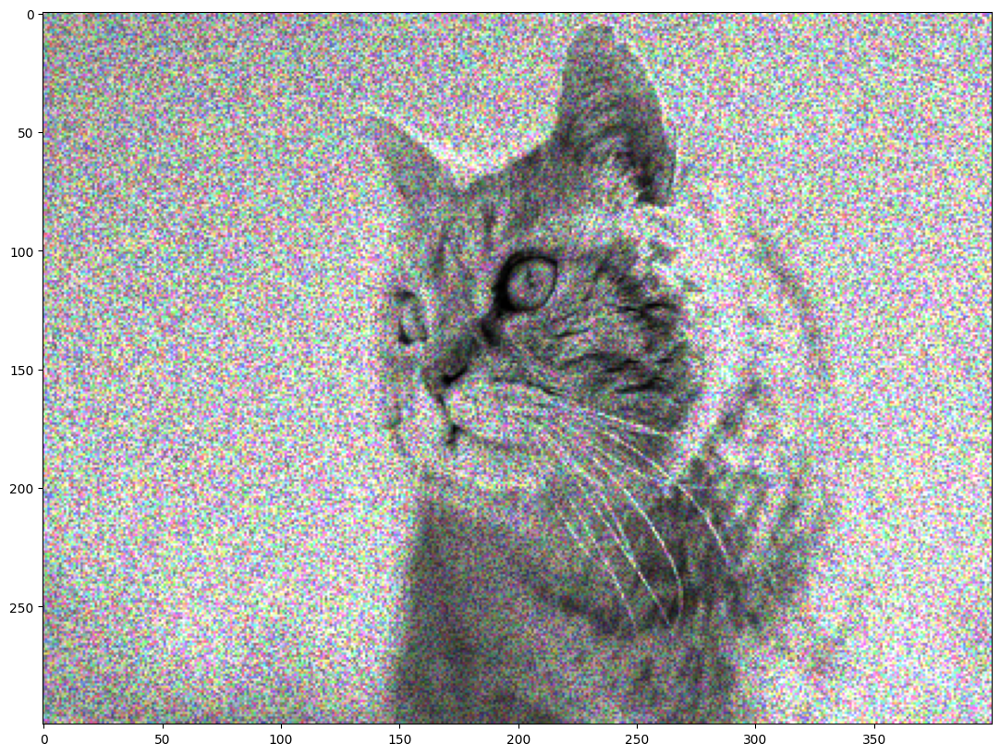

In [29]:
transform = A.Compose(
    [
        A.ToGray(p=1),
        A.MultiplicativeNoise(
            multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1
        ),
    ]
)
transformed = transform(image=image_arr)
visualize(transformed["image"])


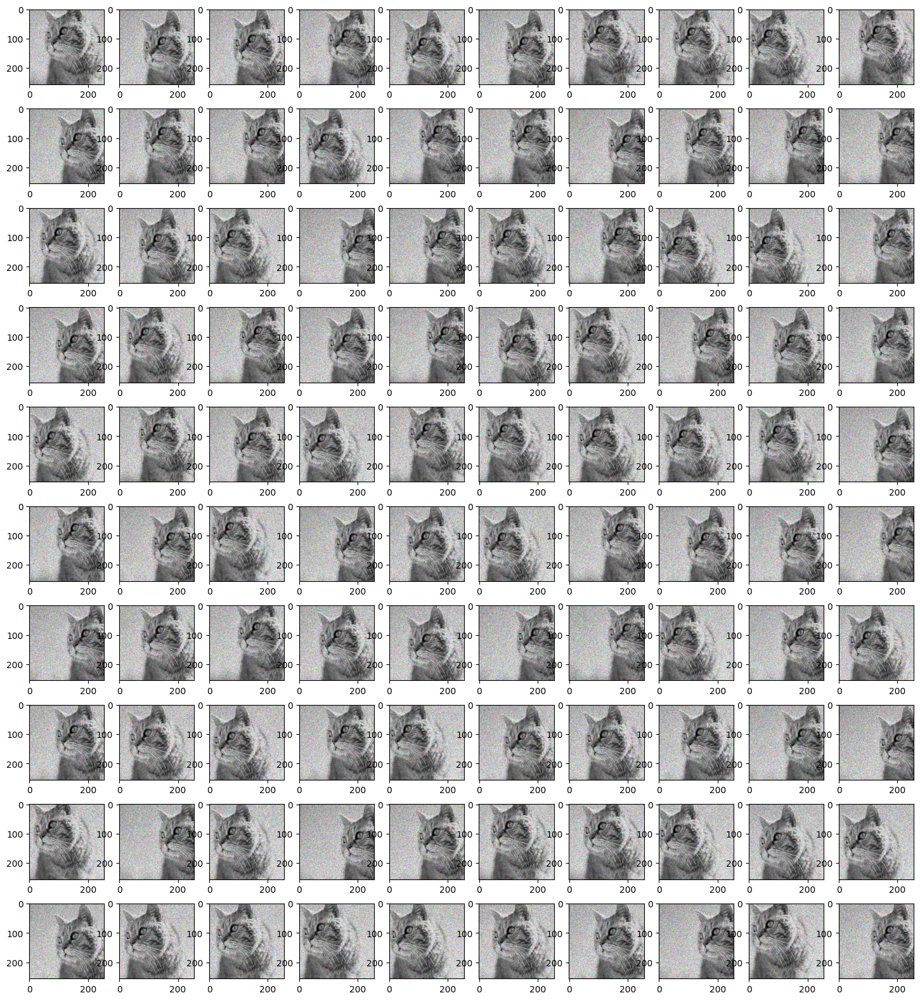

In [30]:
# Use various techniques and functions in albumentations library. show 100 images.
# 여기에 코드를 입력해 주세요.
def transform_data(img_arr):
    transform = A.Compose(
        [
            # 여기에 코드를 입력해 주세요. hint : A.ToGray()
            A.ToGray(p=1),
            # 여기에 코드를 입력해 주세요. hint : A.MultiplicativeNoise()
            A.MultiplicativeNoise(
                multiplier=[0.5, 1.5], elementwise=True, per_channel=True, p=1
            ),
            # 여기에 코드를 입력해 주세요. hint : A.RandomCrop()
            A.RandomCrop(width=256, height=256),
        ]
    )
    t_image = transform(image=img_arr)
    t_image = t_image["image"]
    return t_image


plt.figure(figsize=(18, 20))
for i in range(100):
    image = transform_data(image_arr)
    plt.subplot(10, 10, i + 1)
    plt.imshow(image)
